# Displaying Images with Captions

This notebook displays the 50 testing images, along with the generated captions by ChatGPT, Baseline FLAN-T5 and the Improved FLAN-T5 method, for qualitative comparison of generated captions.

### Set-up

In [1]:
# Loading the reuqired packages
import os
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
# Helper functions

def load_caption(caption):
    """
    Loads a caption csv file from the csv name passed.
    """
    try:
        caption_df = pd.read_csv(caption)
    except FileNotFoundError:
        raise FileNotFoundError(
            f"{caption} not found! Please run the coco_captioning_baseline.py and coco_captioning_improved.py "
            "to obtain the generated captions before proceeding with the evaluation."
        )
    return caption_df


def load_all_captions():
    """
    Load all the captions in the '../data/outputs/captions/' directory.

    :return: Dictionary mapping caption csv file names to the loaded dataframe.
    """
    caption_dir = 'data/outputs/captions/'
    return {c.split('.')[0]: load_caption(caption_dir + c) for c in os.listdir(caption_dir)}

### Loading the relevant images

In [5]:
# Extract the list of images
img_list = list(caption_dic.values())[0]['image_name'].tolist()

# Path to the directory containing the images
image_dir = 'data/coco/val2017/'

### Loading the relevant captions

In [8]:
# Load the generated captions
caption_dic = load_all_captions()

# Paths to the CSV files containing image captions
captions_gpt = 'data/outputs/captions/gpt_caption.csv'
captions_bas = 'data/outputs/captions/baseline_caption.csv'
captions_imp = 'data/outputs/captions/improved_caption.csv'

# Read the CSV files into pandas DataFrames
captions_gpt = pd.read_csv(captions_gpt)
captions_bas = pd.read_csv(captions_bas)
captions_imp = pd.read_csv(captions_imp)

### Display each validation image with three generated captions

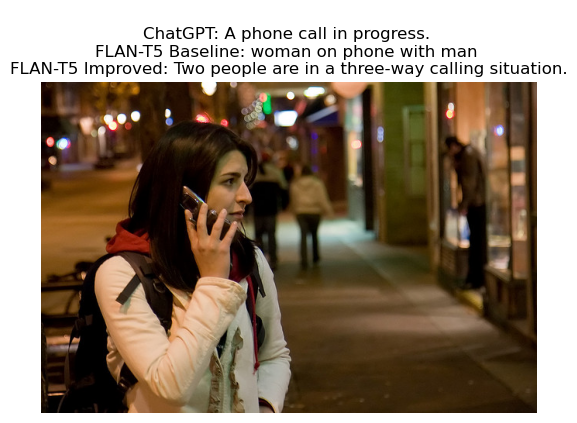

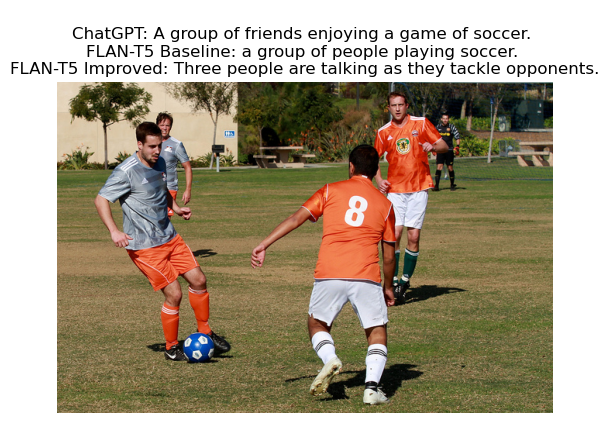

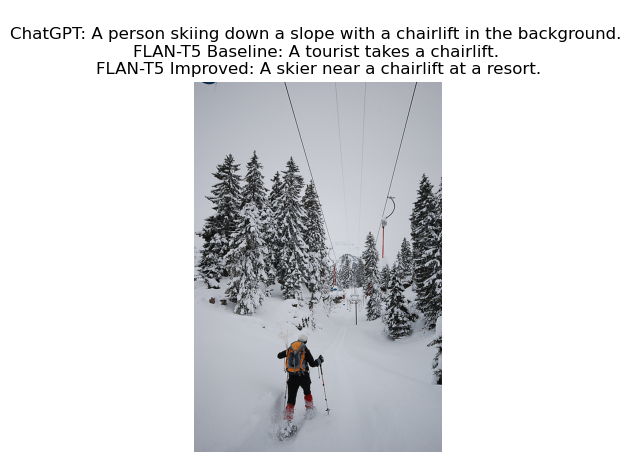

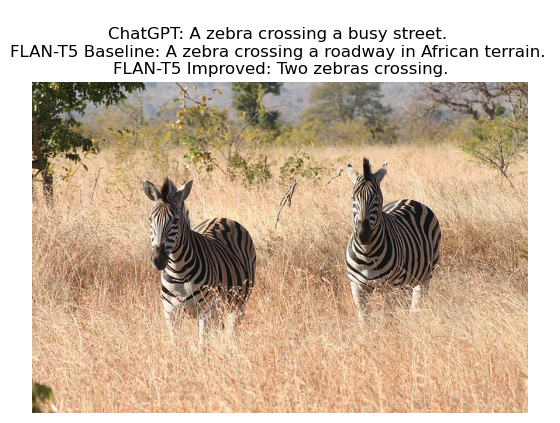

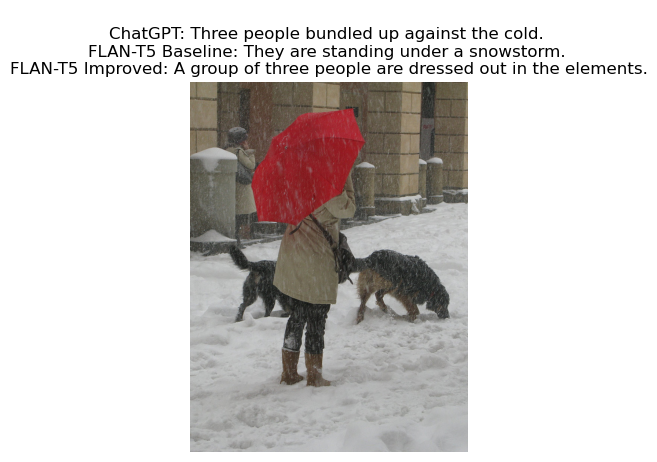

...

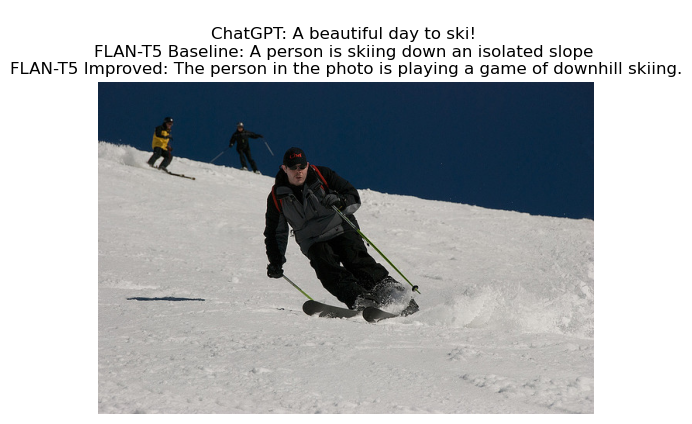

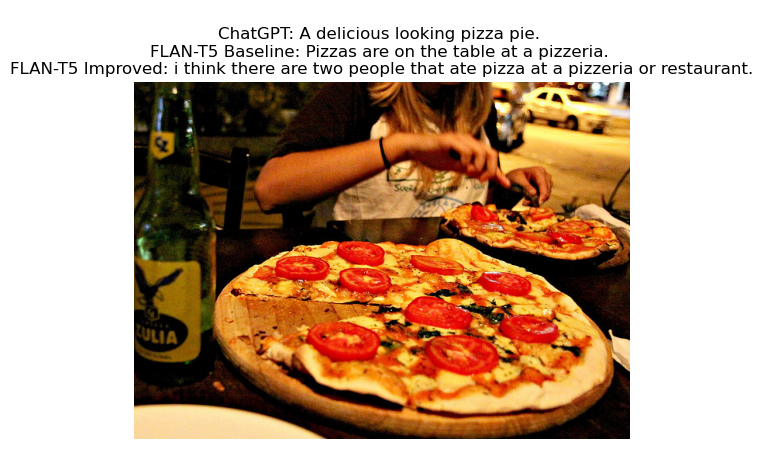

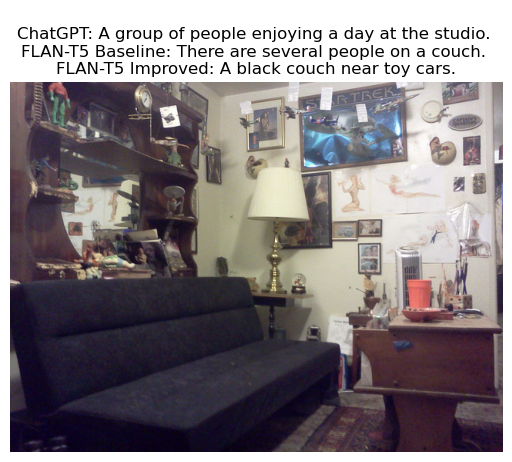

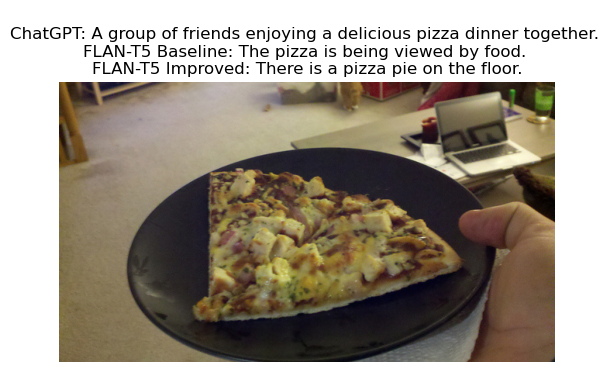

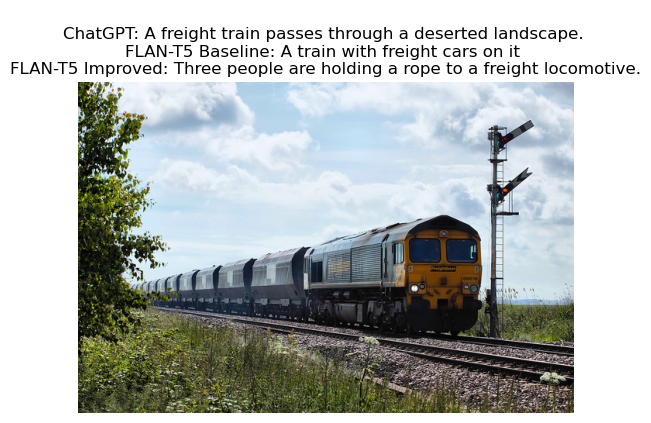

In [15]:
sources = ['ChatGPT', 'FLAN-T5 Baseline', 'FLAN-T5 Improved']

# Iterate over each image file in the directory
for image_name in img_list:
    
    # Find the corresponding captions for the image in each DataFrame
    rel_gpt = captions_gpt[captions_gpt['image_name'] == image_name]['generated_caption']
    rel_bas = captions_bas[captions_bas['image_name'] == image_name]['generated_caption']
    rel_imp = captions_imp[captions_imp['image_name'] == image_name]['generated_caption']

    # Combine all the captions into a single list
    captions = list(rel_gpt) + list(rel_bas) + list(rel_imp)

    # Plot the image and display each caption below it
    image_path = os.path.join(image_dir, image_name)
    image = plt.imread(image_path)
    plt.imshow(image)
    plt.axis('off')

        
    title = [f'\n{sources[i]}: {caption}' for i, caption in enumerate(captions)]
    
    title = ' '.join(title)
    
    plt.title(title)
    plt.show()


### Observations

* CatGPT seems to hallucinate most of the three large language models, although all models do that to some extent
* 
* 